In [1]:
from fastai.vision.all import *

In [2]:
path = untar_data(URLs.PETS)

In [3]:
path.ls()

(#2) [Path('/root/.fastai/data/oxford-iiit-pet/images'),Path('/root/.fastai/data/oxford-iiit-pet/annotations')]

In [4]:
files = get_image_files(path/"images")

In [5]:
len(files)

7390

In [9]:
files[0],files[6],files[57],files[5001]

(Path('/root/.fastai/data/oxford-iiit-pet/images/beagle_115.jpg'),
 Path('/root/.fastai/data/oxford-iiit-pet/images/boxer_128.jpg'),
 Path('/root/.fastai/data/oxford-iiit-pet/images/Egyptian_Mau_85.jpg'),
 Path('/root/.fastai/data/oxford-iiit-pet/images/Bengal_185.jpg'))

In [10]:
def label_func(f): return f[0].isupper()

In [11]:
dls = ImageDataLoaders.from_name_func(path, files, label_func, item_tfms=Resize(224))

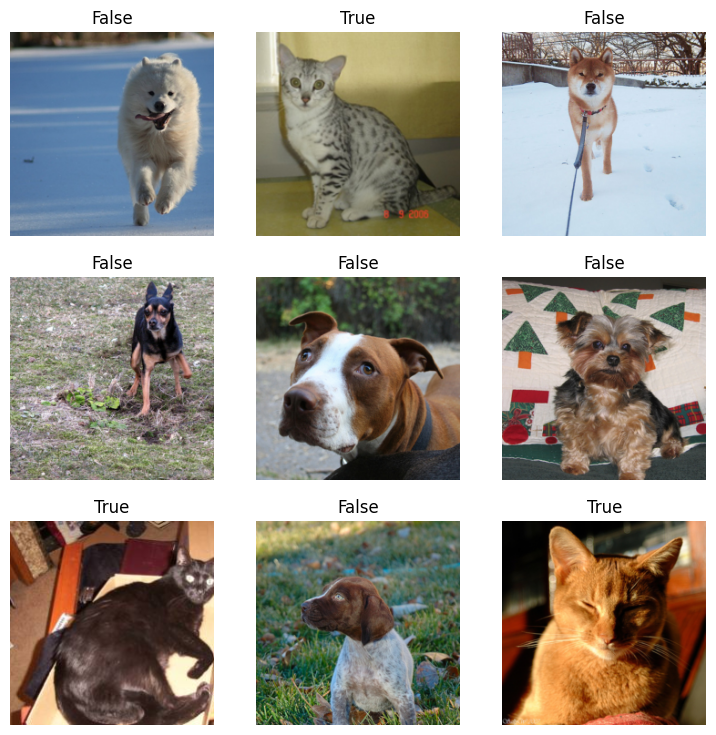

In [12]:
dls.show_batch()

In [13]:
learn = vision_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(1)

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 214MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,0.166704,0.023414,0.005413,00:20


epoch,train_loss,valid_loss,error_rate,time
0,0.056163,0.026026,0.006089,00:21


In [14]:
learn.predict(files[0])

('False', tensor(0), tensor([1.0000e+00, 3.2977e-06]))

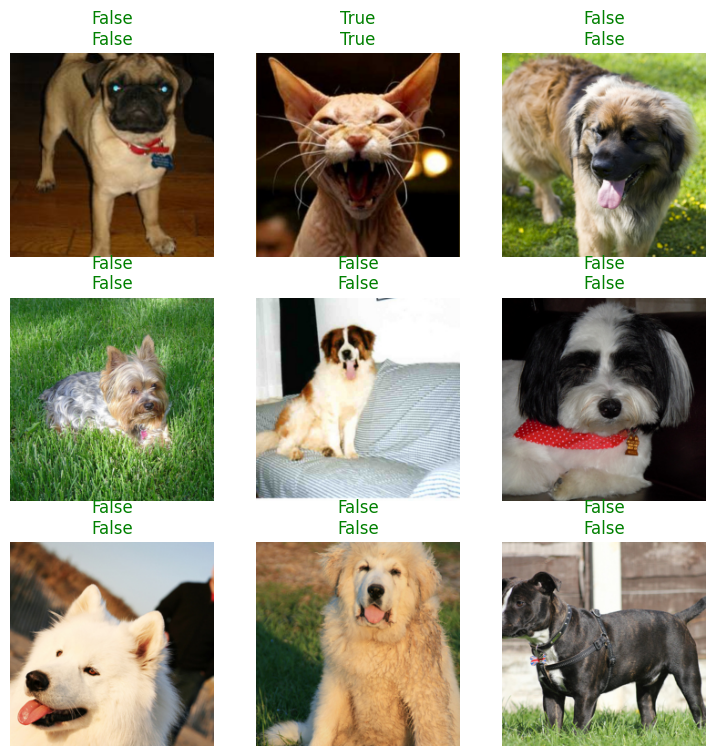

In [15]:
learn.show_results()

In [16]:
files[0].name

'beagle_115.jpg'

In [17]:
pat = r'^(.*)_\d+.jpg'

In [18]:
dls = ImageDataLoaders.from_name_re(path, files, pat, item_tfms=Resize(224))

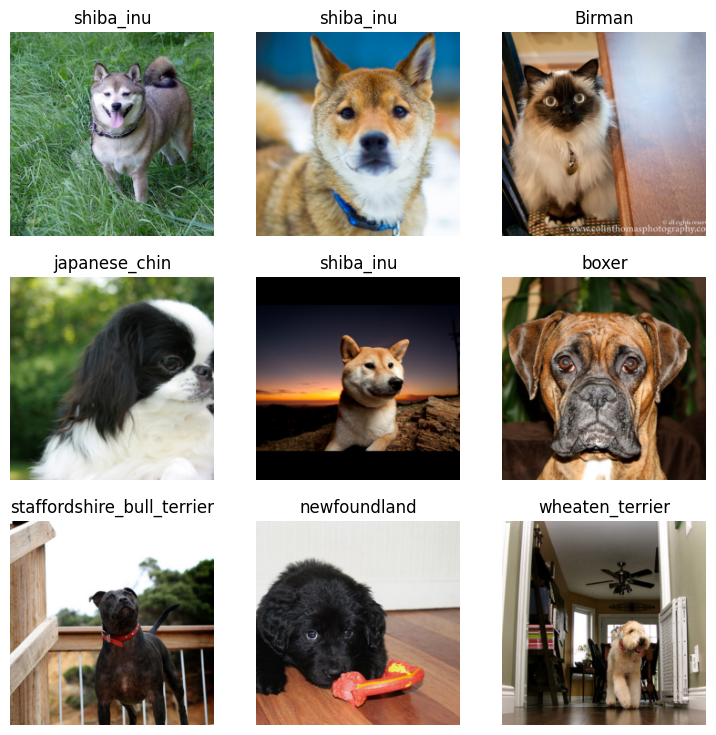

In [19]:
dls.show_batch()

In [20]:
dls = ImageDataLoaders.from_name_re(path, files, pat, item_tfms=Resize(460),
                                    batch_tfms=aug_transforms(size=224))

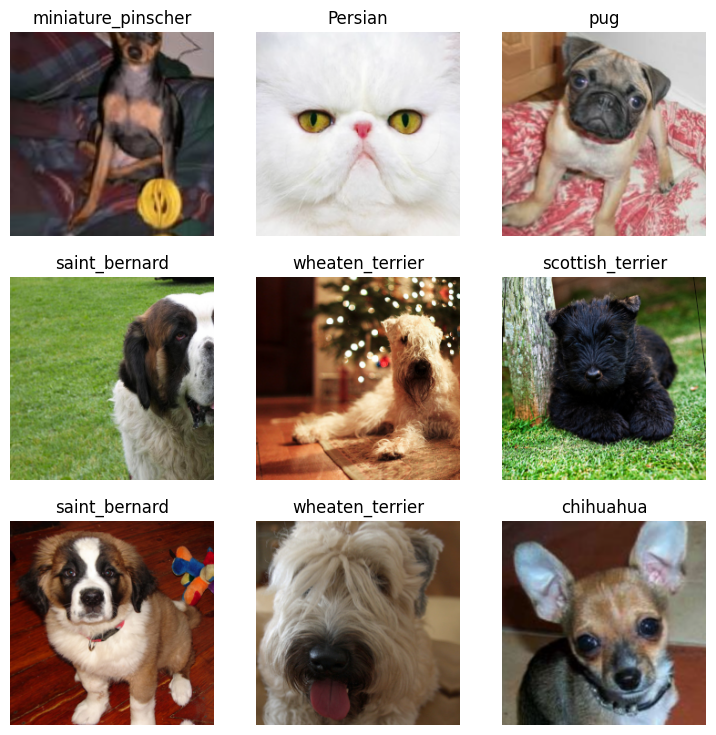

In [22]:
dls.show_batch()

In [23]:
learn = vision_learner(dls, resnet34, metrics=error_rate)

/usr/local/lib/python3.10/dist-packages/fastai/learner.py:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwargs

SuggestedLRs(valley=0.0012022644514217973)

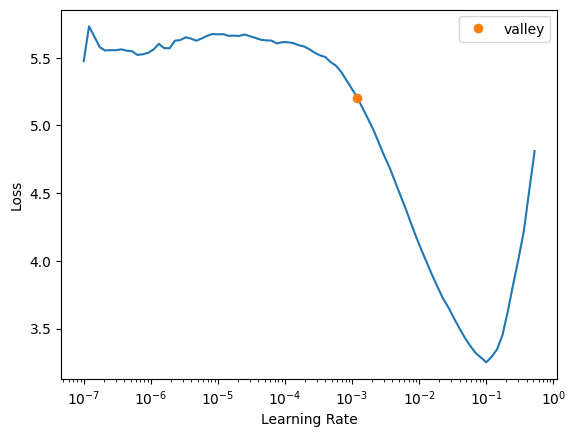

In [24]:
learn.lr_find()

In [25]:
learn.fine_tune(2, 3e-3)

epoch,train_loss,valid_loss,error_rate,time
0,1.343921,0.340270,0.116373,00:35


epoch,train_loss,valid_loss,error_rate,time
0,0.530592,0.384348,0.115020,00:36
1,0.298302,0.244831,0.079161,00:37


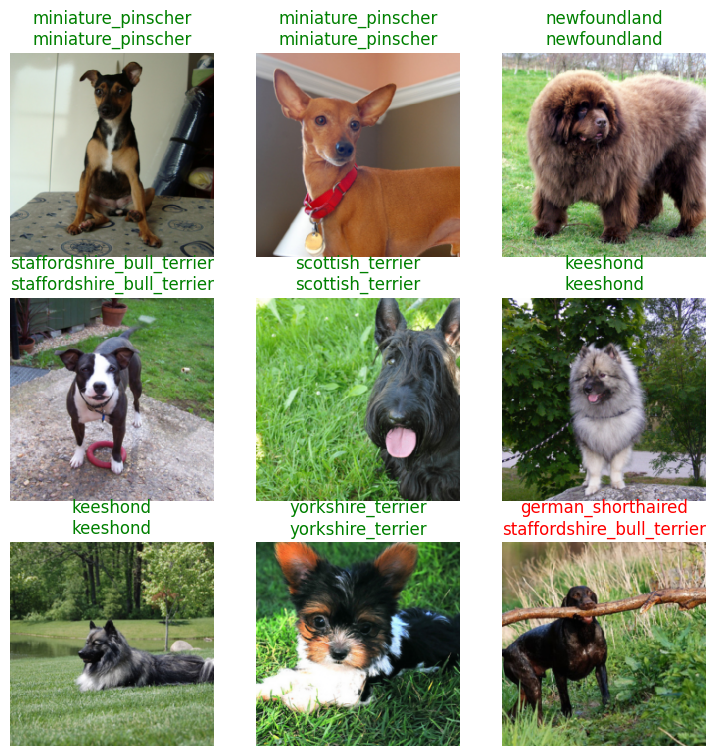

In [26]:
learn.show_results()

In [27]:
interp = Interpretation.from_learner(learn)

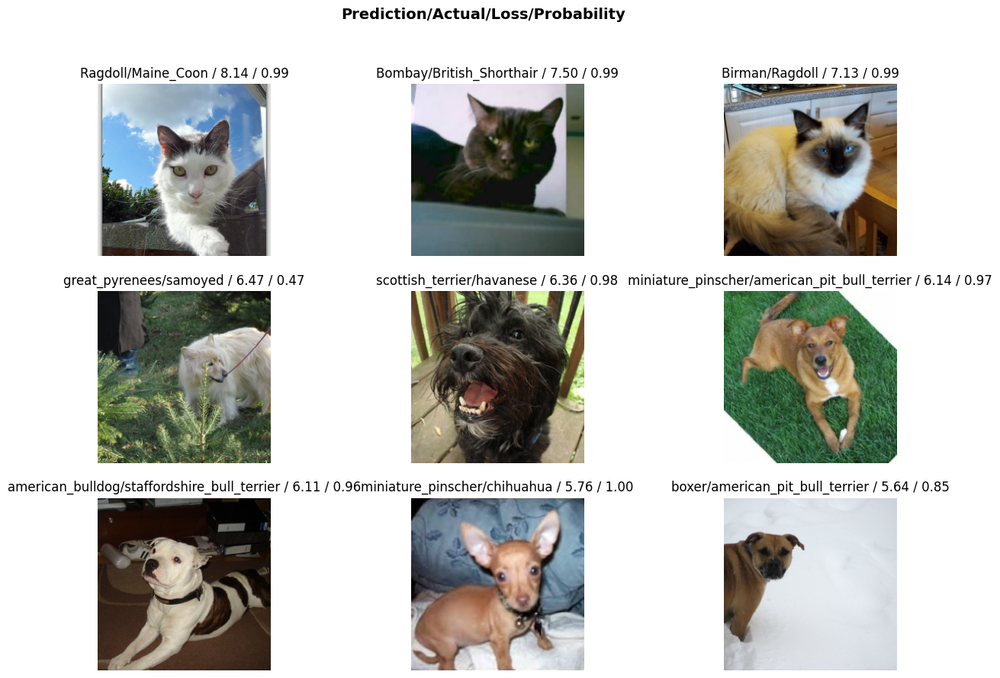

In [28]:
interp.plot_top_losses(9, figsize=(15,10))

In [29]:
pets = DataBlock(blocks=(ImageBlock, CategoryBlock), 
                 get_items=get_image_files, 
                 splitter=RandomSplitter(),
                 get_y=using_attr(RegexLabeller(r'(.+)_\d+.jpg$'), 'name'),
                 item_tfms=Resize(460),
                 batch_tfms=aug_transforms(size=224))

In [30]:
dls = pets.dataloaders(untar_data(URLs.PETS)/"images")

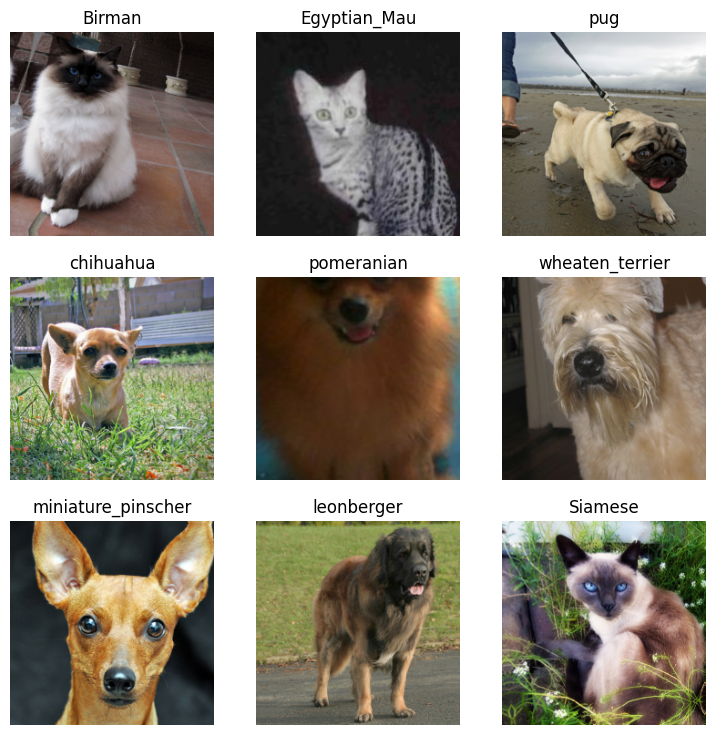

In [31]:
dls.show_batch(max_n=9)

In [32]:
path = untar_data(URLs.PASCAL_2007)
path.ls()

(#8) [Path('/root/.fastai/data/pascal_2007/test.json'),Path('/root/.fastai/data/pascal_2007/train.csv'),Path('/root/.fastai/data/pascal_2007/test'),Path('/root/.fastai/data/pascal_2007/valid.json'),Path('/root/.fastai/data/pascal_2007/train'),Path('/root/.fastai/data/pascal_2007/test.csv'),Path('/root/.fastai/data/pascal_2007/segmentation'),Path('/root/.fastai/data/pascal_2007/train.json')]

In [33]:
df = pd.read_csv(path/'train.csv')
df.head()

,fname,labels,is_valid
0,000005.jpg,chair,True
1,000007.jpg,car,True
2,000009.jpg,horse person,True
3,000012.jpg,car,False
4,000016.jpg,bicycle,True


In [34]:
dls = ImageDataLoaders.from_df(df, path, folder='train', valid_col='is_valid', label_delim=' ',
                               item_tfms=Resize(460), batch_tfms=aug_transforms(size=224))

/usr/local/lib/python3.10/dist-packages/fastai/data/transforms.py:214: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  o = r[c] if isinstance(c, int) or not c in getattr(r, '_fields', []) else getattr(r, c)


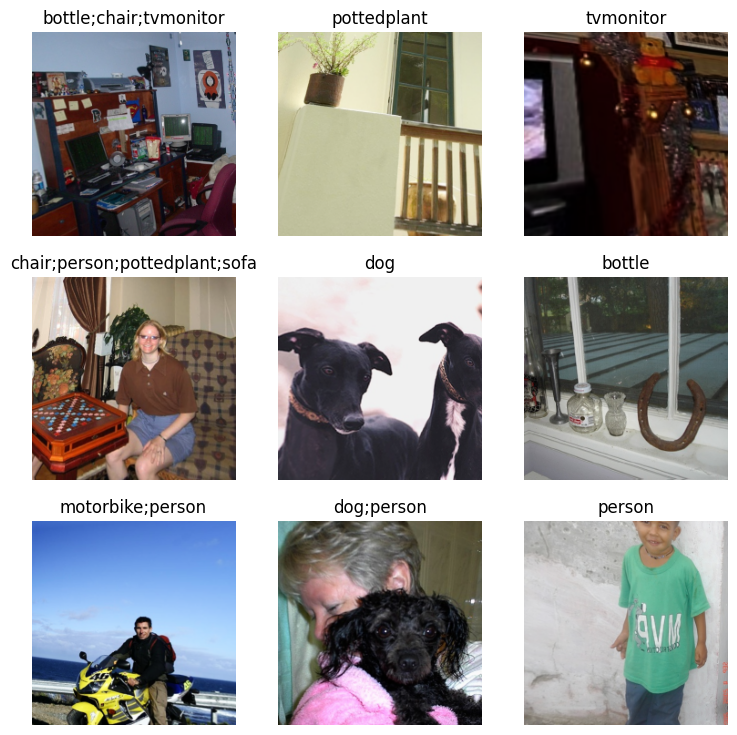

In [35]:
dls.show_batch()

In [36]:
f1_macro = F1ScoreMulti(thresh=0.5, average='macro')
f1_macro.name = 'F1(macro)'
f1_samples = F1ScoreMulti(thresh=0.5, average='samples')
f1_samples.name = 'F1(samples)'
learn = vision_learner(dls, resnet50, metrics=[partial(accuracy_multi, thresh=0.5), f1_macro, f1_samples])

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 187MB/s]


/usr/local/lib/python3.10/dist-packages/fastai/learner.py:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwargs

SuggestedLRs(valley=0.0020892962347716093)

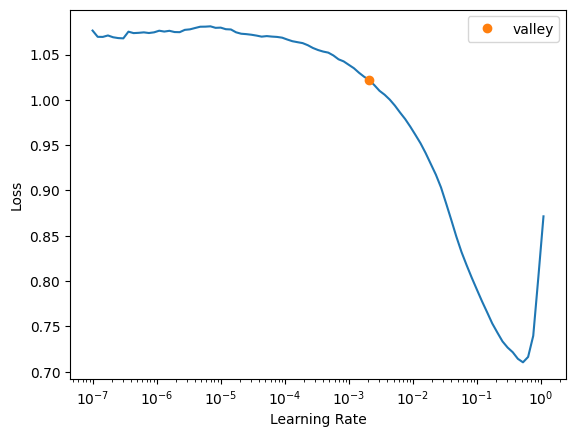

In [37]:
learn.lr_find()

In [38]:
learn.fine_tune(2, 3e-2)

epoch,train_loss,valid_loss,accuracy_multi,F1(macro),F1(samples),time
0,0.447597,0.129375,0.957709,0.683931,0.739743,00:28


epoch,train_loss,valid_loss,accuracy_multi,F1(macro),F1(samples),time
0,0.141623,0.139755,0.953526,0.580629,0.654815,00:29
1,0.117734,0.085388,0.971215,0.752656,0.780273,00:29


/usr/local/lib/python3.10/dist-packages/fastai/data/transforms.py:214: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  o = r[c] if isinstance(c, int) or not c in getattr(r, '_fields', []) else getattr(r, c)
/usr/local/lib/python3.10/dist-packages/fastai/data/transforms.py:214: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  o = r[c] if isinstance(c, int) or not c in getattr(r, '_fields', []) else getattr(r, c)
/usr/local/lib/python3.10/dist-packages/fastai/data/transforms.py:214: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels 

/usr/local/lib/python3.10/dist-packages/fastai/data/transforms.py:214: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  o = r[c] if isinstance(c, int) or not c in getattr(r, '_fields', []) else getattr(r, c)


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))


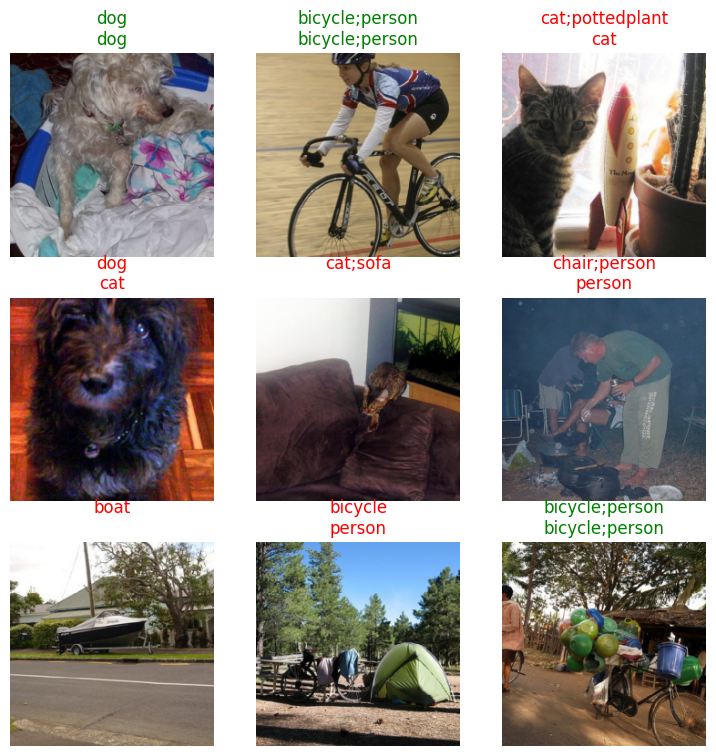

In [39]:
learn.show_results()

In [40]:
learn.predict(path/'train/000005.jpg')

((#2) ['chair','diningtable'],
 tensor([False, False, False, False, False, False, False, False,  True, False,
          True, False, False, False, False, False, False, False, False, False]),
 tensor([1.6125e-03, 2.2352e-04, 6.8503e-04, 8.4375e-03, 1.4634e-02, 1.7980e-04,
         2.5473e-03, 1.5106e-03, 9.7030e-01, 3.2852e-04, 8.3081e-01, 5.0308e-03,
         9.8488e-05, 2.4762e-04, 9.2064e-02, 1.1160e-01, 2.8018e-04, 3.4089e-01,
         1.0863e-03, 9.4757e-02]))

/usr/local/lib/python3.10/dist-packages/fastai/data/transforms.py:214: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  o = r[c] if isinstance(c, int) or not c in getattr(r, '_fields', []) else getattr(r, c)
/usr/local/lib/python3.10/dist-packages/fastai/data/transforms.py:214: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  o = r[c] if isinstance(c, int) or not c in getattr(r, '_fields', []) else getattr(r, c)
/usr/local/lib/python3.10/dist-packages/fastai/data/transforms.py:214: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels 

/usr/local/lib/python3.10/dist-packages/fastai/data/transforms.py:214: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  o = r[c] if isinstance(c, int) or not c in getattr(r, '_fields', []) else getattr(r, c)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))


,target,predicted,probabilities,loss
0,cat;pottedplant,cat,"tensor([9.0170e-18, 7.8536e-21, 4.4118e-21, 7.6869e-13, 1.2712e-10, 7.5877e-17,\n 1.1390e-11, 9.9999e-01, 6.1101e-06, 1.5612e-15, 1.4032e-11, 7.7973e-07,\n 3.5382e-11, 7.2959e-13, 2.5491e-05, 2.2267e-10, 4.3716e-18, 2.4965e-06,\n 1.0406e-18, 5.3209e-08])",1.1112688779830933
1,bird,aeroplane,"tensor([1.0000e+00, 2.4402e-05, 7.2172e-03, 1.5222e-05, 3.4545e-04, 1.3349e-04,\n 4.5503e-04, 2.8062e-05, 1.0422e-04, 1.7377e-04, 2.0684e-04, 2.6509e-04,\n 2.7583e-04, 2.1824e-04, 1.9524e-03, 1.2560e-04, 8.2358e-04, 2.8218e-05,\n 6.0703e-04, 1.0232e-03])",0.8624724745750427
2,car;person;train,car,"tensor([1.0716e-05, 2.1880e-04, 5.1412e-05, 7.0069e-04, 7.2726e-05, 1.6320e-04,\n 9.9976e-01, 4.2858e-05, 1.0407e-03, 4.0598e-05, 2.3956e-05, 5.9841e-05,\n 2.5462e-06, 2.6427e-05, 1.8605e-02, 3.9088e-03, 8.3950e-06, 2.5436e-04,\n 2.2900e-05, 4.0104e-05])",0.7337802648544312
3,bird;cow,dog,"tensor([1.7501e-04, 1.5127e-03, 2.2284e-04, 9.8550e-04, 1.0854e-03, 9.0020e-05,\n 2.2425e-03, 7.6330e-04, 4.3751e-03, 1.5204e-01, 1.5615e-04, 9.8342e-01,\n 3.8723e-02, 4.0629e-04, 1.4894e-02, 5.2681e-03, 6.8648e-03, 1.4718e-03,\n 4.0273e-05, 1.6300e-03])",0.7236937880516052
4,bicycle;bus;car;person,,"tensor([0.3396, 0.0016, 0.0005, 0.0022, 0.0019, 0.0092, 0.4056, 0.0009, 0.0008,\n 0.0013, 0.0015, 0.0007, 0.0010, 0.3890, 0.3615, 0.0015, 0.0008, 0.0004,\n 0.0027, 0.0030])",0.697037935256958
5,bicycle;cat;person,chair;person,"tensor([0.0076, 0.0015, 0.0031, 0.0120, 0.0213, 0.0023, 0.0329, 0.0061, 0.6610,\n 0.0079, 0.3040, 0.0123, 0.0050, 0.0081, 0.9250, 0.0768, 0.0025, 0.0894,\n 0.0304, 0.1400])",0.6804291605949402
6,bicycle;person,aeroplane,"tensor([9.4468e-01, 2.0039e-04, 3.9070e-04, 1.0945e-02, 1.1354e-03, 2.1527e-03,\n 1.4152e-01, 3.9750e-04, 3.4345e-04, 1.0253e-03, 3.7498e-04, 3.5581e-03,\n 9.0985e-04, 1.7950e-02, 2.0969e-01, 1.6088e-03, 5.5873e-03, 2.6673e-04,\n 5.3986e-03, 2.6822e-03])",0.6589791774749756
7,bottle;cow;person,person,"tensor([1.2263e-03, 1.0829e-03, 1.3814e-03, 5.7229e-03, 3.4051e-02, 8.6040e-04,\n 1.8411e-02, 1.3736e-02, 4.6400e-01, 3.8749e-04, 6.5694e-02, 1.0603e-01,\n 1.5296e-02, 1.1519e-03, 8.9358e-01, 7.0098e-02, 6.6685e-04, 3.0515e-01,\n 8.2736e-03, 3.4661e-02])",0.6346070170402527
8,bicycle;person,aeroplane,"tensor([9.2183e-01, 2.9389e-04, 4.7577e-04, 2.0629e-02, 9.8141e-04, 1.9451e-03,\n 7.7125e-02, 6.5874e-04, 1.3251e-03, 4.1743e-03, 3.6128e-04, 4.2907e-03,\n 2.9999e-03, 3.4821e-03, 1.6753e-01, 1.6982e-03, 2.0269e-02, 6.3563e-04,\n 7.5213e-03, 8.7115e-03])",0.631435751914978


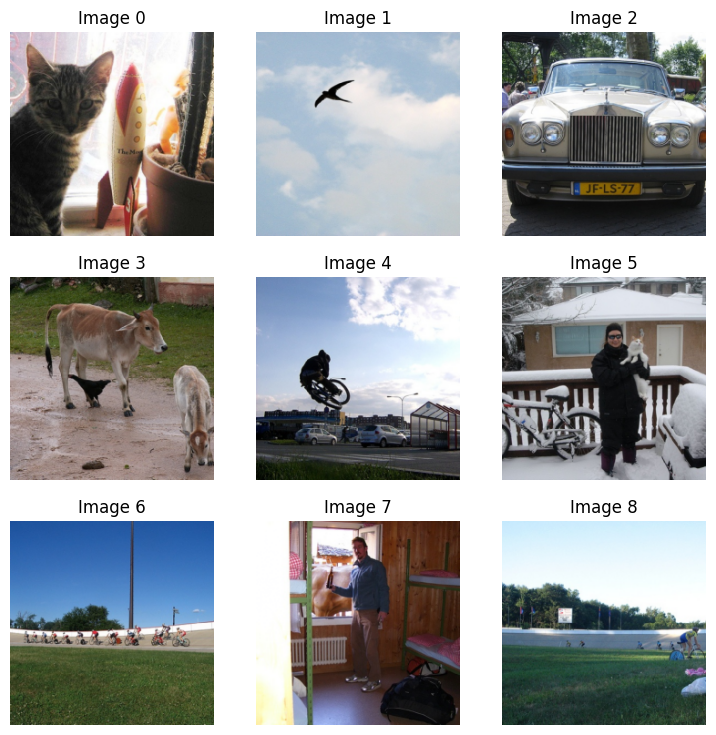

In [41]:
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(9)

In [42]:
df.head()

,fname,labels,is_valid
0,000005.jpg,chair,True
1,000007.jpg,car,True
2,000009.jpg,horse person,True
3,000012.jpg,car,False
4,000016.jpg,bicycle,True


In [43]:
pascal = DataBlock(blocks=(ImageBlock, MultiCategoryBlock),
                   splitter=ColSplitter('is_valid'),
                   get_x=ColReader('fname', pref=str(path/'train') + os.path.sep),
                   get_y=ColReader('labels', label_delim=' '),
                   item_tfms = Resize(460),
                   batch_tfms=aug_transforms(size=224))

In [44]:
dls = pascal.dataloaders(df)

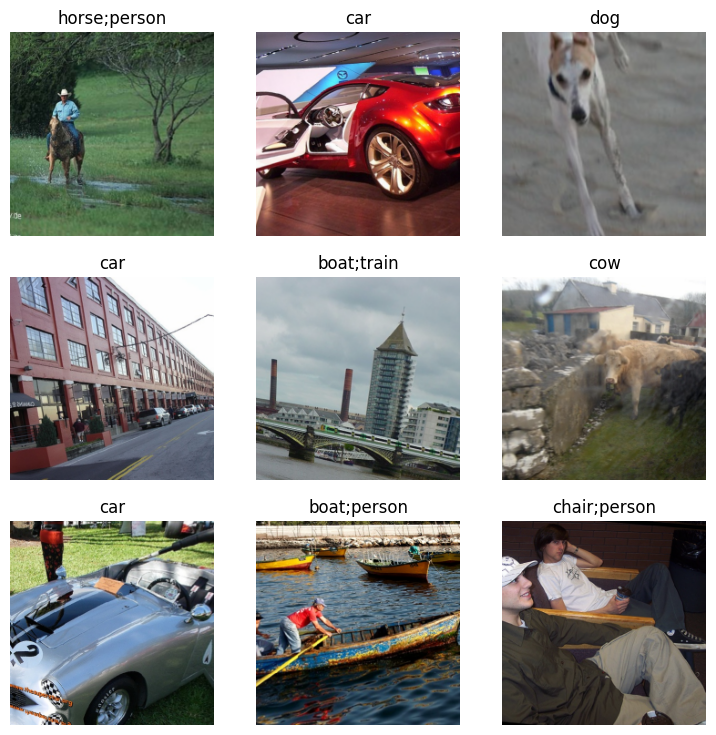

In [45]:
dls.show_batch(max_n=9)